In [1]:
import scanpy as sc
import os
prefix_output = "../Data/results/02" # 02 here is an example for user 02
os.mkdirs(prefix_output, exist_ok=True)
import bin2cell as b2c
import celltypist
from celltypist import models
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'pdf')
os.getcwd()  

'/nfs/team205/ny1/playground/visium_hd/course/Nadav'

<!-- # recover raw reads  -->

# Load b2c he + salvage object 

In [2]:
cdata = sc.read_h5ad(f'{prefix_output}/m_brain_b2c.h5ad') # read the bin2cell (AnnData) object 
cdata # this will print out the basic components of the AnnData object 

AnnData object with n_obs × n_vars = 69902 × 18823
    obs: 'bin_count', 'array_row', 'array_col', 'labels_joint_source'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped'

In [3]:
cdata = cdata[cdata.obs['bin_count']>5] # min 5 bins to filter very small cells
cdata.X.data = np.round(cdata.X.data) # convert data back in to count integers 

In [4]:
sc.pp.filter_genes(cdata, min_cells=3) # remove genes that are found in less than 3 cells 
sc.pp.filter_cells(cdata,min_genes=50) # remove cell that have less than 50 genes
sc.pp.calculate_qc_metrics(cdata,inplace=True) # claluclate QC score 

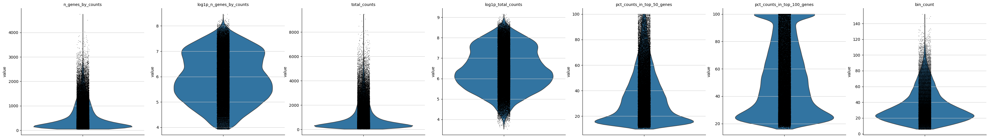

In [5]:
# plt QC scores
sc.set_figure_params(dpi=50,fontsize=10,)
sc.pl.violin(cdata, ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 
                     'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes','bin_count'],jitter=0.05, multi_panel=True)

In [6]:
# normalize the data as it should be for cellTypist 
sc.pp.normalize_total(cdata,target_sum=1e4) 
sc.pp.log1p(cdata)
b2c_predictions = celltypist.annotate(cdata, model = 'Mouse_Whole_Brain.pkl', majority_voting = False) # use the mouse model to generate predictions 
cdata = b2c_predictions.to_adata()

🔬 Input data has 66493 cells and 18554 genes
🔗 Matching reference genes in the model
🧬 4585 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [7]:
# save the filtered 
cdata.write(f'{prefix_output}/'mb_b2c.h5ad')

# Remove cells that are barely detected (<20) 

In [8]:
cdata = sc.read_h5ad(f'{prefix_output}/'mb_b2c.h5ad')
cdata

AnnData object with n_obs × n_vars = 66493 × 18554
    obs: 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'predicted_labels', 'conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'spatial'
    obsm: 'spatial', 'spatial_cropped'

In [9]:
# get cell numbers per type 
import pandas as pd
pd.set_option('display.max_rows', 500)
cdata.obs['predicted_labels'].value_counts()

predicted_labels
319 Astro-TE NN                           15141
333 Endo NN                                7351
045 OB-STR-CTX Inh IMN                     4913
327 Oligo NN                               3262
264 PRNc Otp Gly-Gaba                      3170
332 SMC NN                                 2533
151 TH Prkcd Grin2c Glut                   2159
331 Peri NN                                1862
318 Astro-NT NN                            1676
006 L4/5 IT CTX Glut                       1628
009 L2/3 IT PIR-ENTl Glut                  1482
037 DG Glut                                1232
338 Lymphoid NN                            1171
007 L2/3 IT CTX Glut                       1050
004 L6 IT CTX Glut                         1009
154 PF Fzd5 Glut                            735
061 STR D1 Gaba                             698
016 CA1-ProS Glut                           656
321 Astroependymal NN                       641
330 VLMC NN                                 636
053 Sst Gaba           

In [10]:
# we see that some cell types only have a few members, to get a cleaner picture we will subset to cells that have more that 10 members 
# first we need to find these cell categories one of the easy tricks is to convert to a numpy array of booleans
above10 = np.array(cdata.obs['predicted_labels'].value_counts() > 20)
above10.shape

(269,)

In [11]:
# now we also need a list of categories ordered in the same way 
cell_types = cdata.obs['predicted_labels'].value_counts().keys().to_series()
cell_types.shape

(269,)

In [12]:
# we can now find the cell types above 10 by slicing the list by our boolean array 
cell_types_above = cell_types[above10]
cell_types_above.shape

(118,)

In [13]:
# now we can easily pull out these cells from the object and generate a new object 
ddata = cdata[cdata.obs['predicted_labels'].isin(cell_types_above)]
ddata

View of AnnData object with n_obs × n_vars = 65584 × 18554
    obs: 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'predicted_labels', 'conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'spatial'
    obsm: 'spatial', 'spatial_cropped'

In [14]:
ddata.obs['predicted_labels'].value_counts()

predicted_labels
319 Astro-TE NN                           15141
333 Endo NN                                7351
045 OB-STR-CTX Inh IMN                     4913
327 Oligo NN                               3262
264 PRNc Otp Gly-Gaba                      3170
332 SMC NN                                 2533
151 TH Prkcd Grin2c Glut                   2159
331 Peri NN                                1862
318 Astro-NT NN                            1676
006 L4/5 IT CTX Glut                       1628
009 L2/3 IT PIR-ENTl Glut                  1482
037 DG Glut                                1232
338 Lymphoid NN                            1171
007 L2/3 IT CTX Glut                       1050
004 L6 IT CTX Glut                         1009
154 PF Fzd5 Glut                            735
061 STR D1 Gaba                             698
016 CA1-ProS Glut                           656
321 Astroependymal NN                       641
330 VLMC NN                                 636
053 Sst Gaba           

# Plot the spatial distributions of selected cell types 

In [15]:
# Scanpy has some nice plotting functions that we can use to plot .obs (annotations) or .vars (genes) 

In [16]:
cells_to_plot = ['037 DG Glut', '016 CA1-ProS Glut','025 CA2-FC-IG Glut', '017 CA3 Glut',]

In [17]:
# 2 ways of doing this 

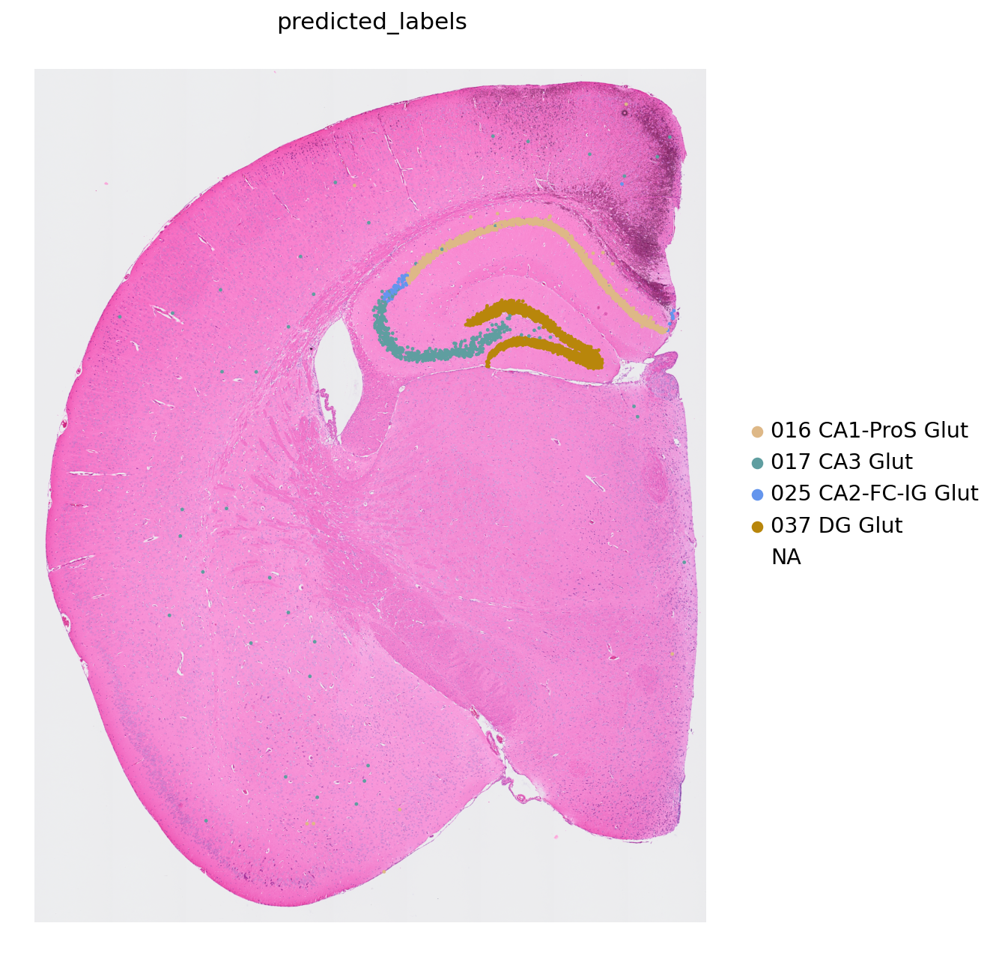

In [18]:
# 1 - define cells as groups 
sc.set_figure_params(figsize=[10,10])
sc.pl.spatial(ddata, color='predicted_labels', groups=cells_to_plot,spot_size=100, frameon=False, palette=list(matplotlib.colors.CSS4_COLORS.values()))

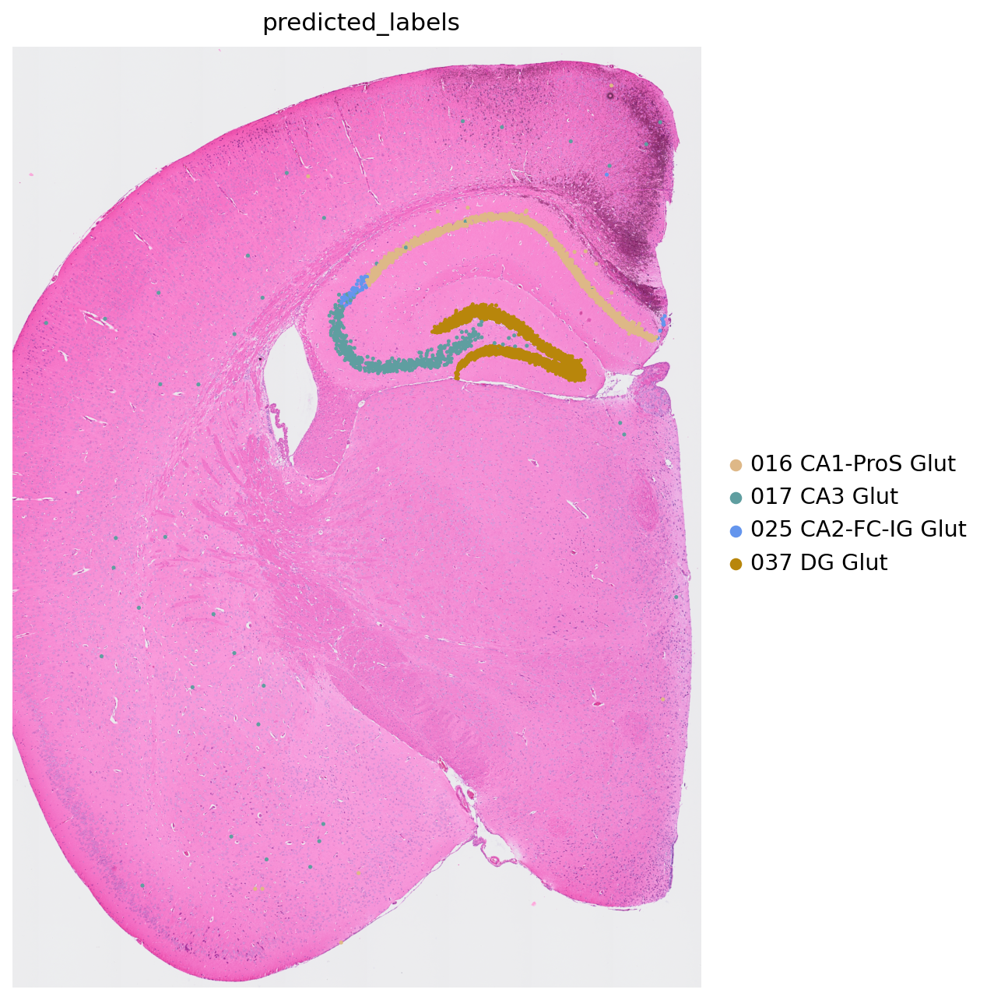

In [19]:
# 2 - temporarily subset the object to these cells 
sc.set_figure_params(figsize=[10,10])
sc.pl.spatial(ddata[ddata.obs['predicted_labels'].isin(cells_to_plot)], color='predicted_labels',spot_size=100, frameon=False,)

In [20]:
# notice the difference in borders, the new object that is limited to these cells has different boundaries 

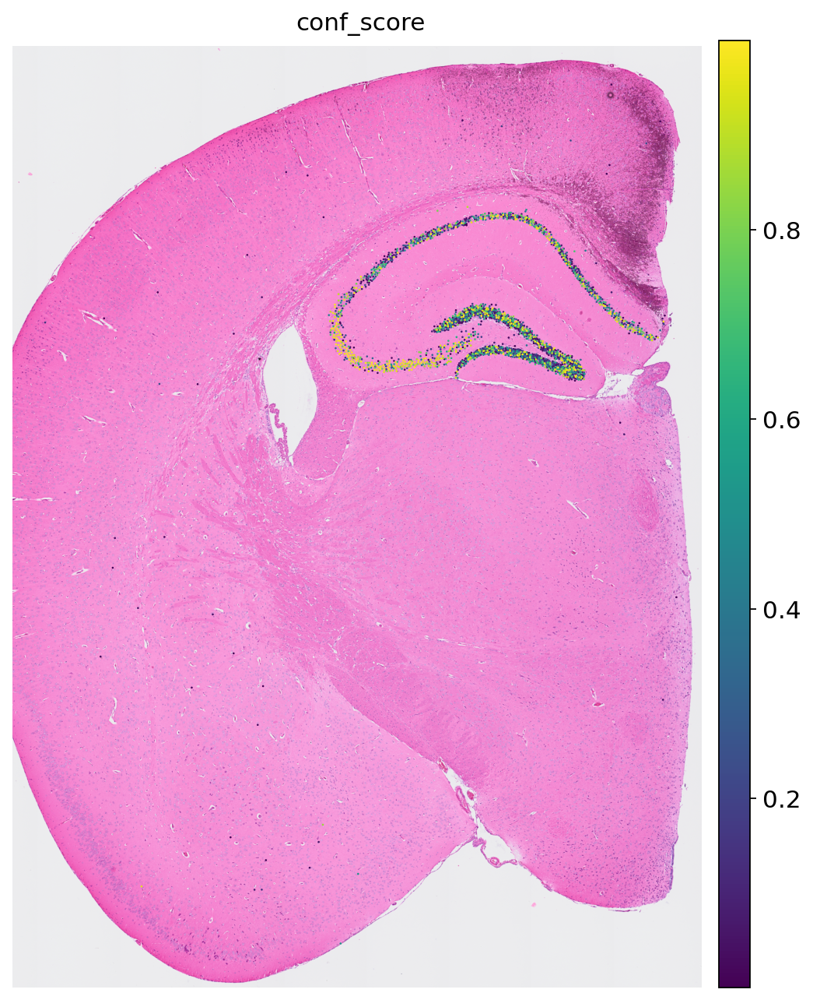

In [21]:
# the advantage of subsetting the object is that we can plot another feature on top 
sc.set_figure_params(figsize=[10,10])
sc.pl.spatial(ddata[ddata.obs['predicted_labels'].isin(cells_to_plot)], color='conf_score',spot_size=50, frameon=False,cmap='viridis')

# lets also filter cells by confidence 

In [22]:
edata = ddata[ddata.obs['conf_score']>0.1]

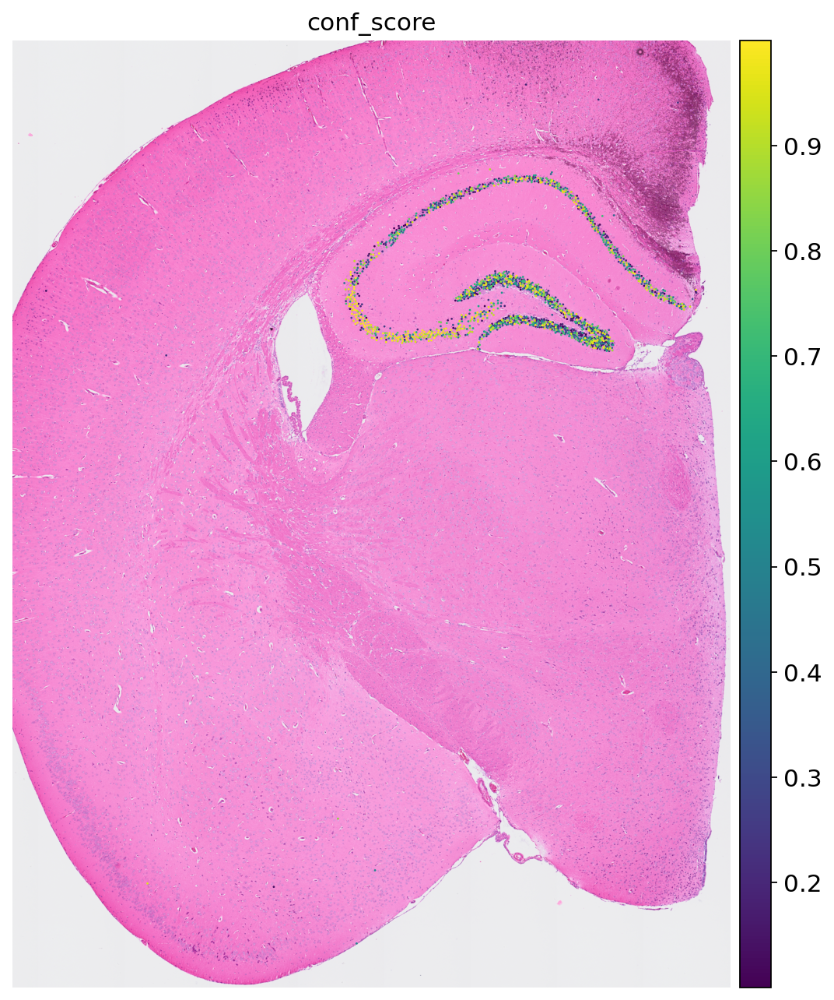

In [23]:
sc.pl.spatial(edata[edata.obs['predicted_labels'].isin(cells_to_plot)], color='conf_score',spot_size=50, frameon=False,cmap='viridis')